In [ ]:
from dask.distributed import Client
client = Client()
client

import dask.dataframe as dd
import pyarrow

In [ ]:
"""

"""
# dir_mer = './data/merged/E-121-5546-2797.csv'  
# dir_mer = './data/merged/N-135-0298-6224.csv'
# dir_mer = './data/merged/E-089-3058-5917.csv'


# ddf = dd.read_csv(f'{dir_mer}', assume_missing=True)
# ddf = ddf.repartition(npartitions=8)


https://www.opm.gov/policy-data-oversight/pay-leave/federal-holidays/#url=Historical-Data

In [96]:
import numpy as np
from datetime import datetime
from datetime import timedelta
import pandas as pd
import time
import fastparquet 
import os
from termcolor import colored

# pd.set_option("display.max_rows",None)


from project_tools import load_obj, save_obj
Holiday_schedules = load_obj('Holiday_schedules')

In [97]:
"""
This manages wavelets for CCS data files
E-089-3058-5917.csv
""" 
# dir_mer = './data/merged/E-121-5546-2797.csv'  
# dir_mer = './data/merged/N-135-0298-6224.csv'
dir_mer = './data/merged/E-089-3058-5917.csv'

fields = ['time_anchor_vds', 'std_time', 'ccs_speed', 'vds_occ', 'ccs_vol','vds_vol', 'ccs_speed', 'Direction',
       'one_hot_weekday', 'one_hot_weekend', 'one_hot_non_rush_hr',
       'one_hot_rush_hr',]
df = pd.read_csv(f'{dir_mer}', usecols=fields)
df = df.sort_values(by=['time_anchor_vds'], ascending=True)


In [98]:
df.head()

,time_anchor_vds,std_time,vds_vol,ccs_vol,ccs_speed,vds_occ,Direction,one_hot_weekday,one_hot_weekend,one_hot_non_rush_hr,one_hot_rush_hr
77231,165.0,2019-07-31 13:45:00,110.0,237.0,71.8,7.53,E,1,0,1,0
77232,166.0,2019-07-31 13:50:00,117.0,241.0,70.7,8.46,E,1,0,1,0
77233,167.0,2019-07-31 13:55:00,145.0,261.0,70.7,10.41,E,1,0,1,0
77234,168.0,2019-07-31 14:00:00,156.0,256.0,70.4,11.46,E,1,0,1,0
77235,169.0,2019-07-31 14:05:00,139.0,221.0,70.6,9.93,E,1,0,1,0


In [3]:
def reformat_time(x, return_value=True, map_date=True):
    x=x.split()
    date=x[0].split('-')
    time=x[1][:-3]
    date = '/'.join([date[1]]+[date[2]]+[date[0]])
    if return_value:
        time = time2Mins(time)
        date = date2Mins(date)
        return (date+time)
    else:
        return date if map_date else time
    
    

# one hot times into bool value one_hots
def OneHot(NewName, oldName, df, exceptions=[]):
    uniqueL = df[str(oldName)].unique()
    for item in uniqueL:
        if (item in exceptions):
            df[str(NewName) + '_Other'] =  np.where(df[str(oldName)] == str(item), 1, 0)
        else:
            df[str(NewName) + '_' + str(item)] =  np.where(df[str(oldName)] == str(item), 1, 0)
    df = df.drop([str(oldName)], axis = 1)
    return df
# creat bool weekend/weekday
def weekBool(x):#used std_time
    x = reformat_time(x, return_value=False)
    dayNum = datetime.strptime(x, "%m/%d/%Y").weekday()
    return 'weekday' if dayNum in [0,1,2,3,4] else 'weekend'

def week_value(x):#used std_time
    x = reformat_time(x, return_value=False)
    dayNum = datetime.strptime(x, "%m/%d/%Y").weekday()
    return dayNum


def week_idx(x):# get unique value for each day
    x = reformat_time(x, return_value=False)
    day_id = datetime.strptime(x, "%m/%d/%Y")
    return day_id


# creat bool rush_hr/non_rush_hr
def rushBool(x):
    x = reformat_time(x, return_value=False, map_date=False) # returns time format hr:min 06:35
    x = time2Mins(x)
    if (int(x) >= 84) and (int(x) <= 120):# 7am-10am
        x = 'rush_hr'
    elif (int(x) >= 180) and (int(x) <= 240):# 3pm-8pm
        x = 'rush_hr'
    else:
        x = 'non_rush_hr'
    return x

df['day_id'] = df['std_time'].map(week_idx)
df['week_value'] = df['std_time'].map(week_value)


# remove holiday's
def holiday(x):# get unique value for each day
    x = reformat_time(x, return_value=False)
    if str(x) in Holiday_schedules:
        day_id = 0
    else:
        day_id = datetime.strptime(x, "%m/%d/%Y")
    return day_id


df['std_time'] = df['std_time'].map(holiday)
df = df[df['std_time']!=0]



# select full days from data sets
fulldays = []
for item in df.day_id.unique():
    if len(df[df.day_id==item]) == 288:
        fulldays.append(item)
        
culled_df = df[df.day_id.isin(fulldays)]


# generate a data set with np.arrays and labels
X, y = [[] for x in range(len(fulldays))], [[] for x in range(len(fulldays))] # generate cells for data
for idx, (day) in enumerate(fulldays):
    selected = culled_df[culled_df.day_id == day]
    
    my_array = np.array(selected.ccs_vol.tolist())
    X[idx] = my_array
    y[idx] = selected.iloc[-1,-2]
    
train_labels_indicies = [[] for x in range(len(fulldays))]



In [4]:
culled_df.head(1)

,time_anchor_vds,std_time,vds_vol,ccs_vol,ccs_speed,vds_occ,Direction,one_hot_weekday,one_hot_weekend,one_hot_non_rush_hr,one_hot_rush_hr,day_id,week_value
77354,288.0,2019-08-01 00:00:00,63.0,89.0,70.7,3.72,E,1,0,1,0,2019-08-01,3


In [6]:
import tensorflow as tf
print(f"TensorFlow version: {tf.__version__}")
#import keras (high level API) wiht tensorflow as backend
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import pywt
import seaborn as sns
import scaleogram as scg

TensorFlow version: 2.4.1


In [ ]:
# def plot_cwt_coeffs_per_label(X, label_indicies, label_names, signal, sample, scales, wavelet):
    
#     fig, axs = plt.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(12,5))
    
#     for ax, indices, name in zip(axs.flat, [88,5,97,195,196,8,9], label_names):
#         # apply  PyWavelets continuous wavelet transfromation function
#         coeffs, freqs = pywt.cwt(X[indices], scales, wavelet = wavelet)
#         # create scalogram
#         ax.imshow(coeffs, cmap = 'coolwarm', aspect = 'auto')
#         ax.set_title(name)
#         ax.spines['right'].set_visible(False)
#         ax.spines['top'].set_visible(False)
#         ax.set_ylabel('Scale')
#         ax.set_xlabel('Time')
#     plt.tight_layout()



# #signal indicies: 0 = body acc x, 1 = body acc y, 2 = body acc z, 3 = body gyro x, 4 = body gyro y, 5 = body gyro z, 6 = total acc x, 7 = total acc y, 8 = total acc z
# signal = 3 # signal index
# sample = 1 # sample index of each label indicies list
# scales = np.arange(1, 45) # range of scales
# wavelet = 'morl' # mother wavelet

# plot_cwt_coeffs_per_label(X, list(set(y)), list(set(y)), None, sample, scales, wavelet)

In [7]:
"""
Two channel
"""

# generate a data set with np.arrays and labels
X, y = [[] for x in range(len(fulldays))], [[] for x in range(len(fulldays))] # generate cells for data
for idx, (day) in enumerate(fulldays):
    selected = culled_df[culled_df.day_id == day]
    
    vol = selected.ccs_vol.tolist()
    spd = selected.ccs_speed.tolist()
    
    combo = [[x, y] for x, y in zip(vol,spd)]
    my_array = np.array(combo)
    
    X[idx] = my_array
    y[idx] = selected.iloc[-1,-1]
    
train_labels_indicies = [[] for x in range(len(fulldays))]

X = np.array(X)
y = np.array(y)




"""
For 2 channels
"""
# X = np.array(X)
# y = np.array(y)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

from skimage.transform import resize

def create_cwt_images(X, n_scales, rescale_size, wavelet_name = "morl"):
    n_samples = X.shape[0] 
    n_signals = X.shape[2] 
    
    # range of scales from 1 to n_scales
    scales = np.arange(1, n_scales + 1) 
    
    # pre allocate array
    X_cwt = np.ndarray(shape=(n_samples, rescale_size, rescale_size, n_signals), dtype = 'float32')
    
    for sample in range(n_samples):
        if sample % 1000 == 0:
            print(sample)
        for signal in range(n_signals):
            serie = X[sample, :, signal]
            # continuous wavelet transform 
            coeffs, freqs = pywt.cwt(serie, scales, wavelet_name)
            # resize the 2D cwt coeffs
            rescale_coeffs = resize(coeffs, (rescale_size, rescale_size), mode = 'constant')
            X_cwt[sample,:,:,signal] = rescale_coeffs
            
    return X_cwt
  
# amount of pixels in X and Y 
rescale_size = 64
# determine the max scale size
n_scales = 64

X_train_cwt = create_cwt_images(X_train, n_scales, rescale_size)
print(f"shapes (n_samples, x_img, y_img, z_img) of X_train_cwt: {X_train_cwt.shape}")
X_test_cwt = create_cwt_images(X_test, n_scales, rescale_size)
print(f"shapes (n_samples, x_img, y_img, z_img) of X_test_cwt: {X_test_cwt.shape}")


X_train_cwt_re = X_train_cwt.reshape(-1, 64, 64, 2)
X_test_cwt_re = X_test_cwt.reshape(-1, 64, 64, 2)
yt = np.array(y_train)
ytest = np.array(y_test)


def build_cnn_model(activation, input_shape):
    model = Sequential()
    
    # 2 Convolution layer with Max polling
    model.add(Conv2D(32, 5, activation = activation, padding = 'same', input_shape = input_shape))
    model.add(MaxPooling2D())
    model.add(Conv2D(64, 5, activation = activation, padding = 'same', kernel_initializer = "he_normal"))
    model.add(MaxPooling2D())  
    model.add(Flatten())
    
    # 3 Full connected layer
    model.add(Dense(128, activation = activation, kernel_initializer = "he_normal"))
    model.add(Dense(54, activation = activation, kernel_initializer = "he_normal"))
    model.add(Dense(7, activation = 'softmax')) # 6 classes
    
    # summarize the model
    print(model.summary())
    return model

input_shape = X_train_cwt_re.shape[1:]
print(input_shape)

cnn_model = build_cnn_model("relu", input_shape)



# create cnn model
cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy'])

# define callbacks
callbacks = [ModelCheckpoint(filepath='best_model.h5', monitor='val_sparse_categorical_accuracy', save_best_only=True)]

# fit the model
history = cnn_model.fit(x=X_train_cwt_re,
                    y=yt,
                    batch_size=100,
                    epochs=50,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=(X_test_cwt_re, ytest))

0
shapes (n_samples, x_img, y_img, z_img) of X_train_cwt: (293, 64, 64, 2)
0
shapes (n_samples, x_img, y_img, z_img) of X_test_cwt: (33, 64, 64, 2)
(64, 64, 2)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 64, 32)        1632      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 64)        51264     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 16384)             0         
_________________________________________________________________
dense (Dense)               

In [ ]:
"""
One Channel
"""

# generate a data set with np.arrays and labels
X, y = [[] for x in range(len(fulldays))], [[] for x in range(len(fulldays))] # generate cells for data
for idx, (day) in enumerate(fulldays):
    selected = culled_df[culled_df.day_id == day]
    my_array = selected.ccs_vol.tolist()
#     spd = selected.ccs_speed.tolist()
    
#     combo = [[x, y] for x, y in zip(vol,spd)]
#     my_array = np.array(combo)
    
    X[idx] = my_array
    y[idx] = selected.iloc[0,-1]
    
train_labels_indicies = [[] for x in range(len(fulldays))]

X = np.array(X)
y = np.array(y)



"""
Testng a model and deviding the days
"""


from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

from skimage.transform import resize

def create_cwt_images(X, n_scales, rescale_size, wavelet_name = "morl"):
    n_samples = len(X)

    # range of scales from 1 to n_scales
    scales = np.arange(1, n_scales + 1) 
    
    # pre allocate array
    X_cwt = np.ndarray(shape=(n_samples, rescale_size, rescale_size), dtype = 'float32')
    
    for sample in range(n_samples):
#         if sample % 1000 == 0:
#             print(sample)
#         for signal in range(n_signals):
        serie = X[sample]
        # continuous wavelet transform 
        coeffs, freqs = pywt.cwt(serie, scales, wavelet_name)
        # resize the 2D cwt coeffs
        rescale_coeffs = resize(coeffs, (rescale_size, rescale_size), mode = 'constant')
        X_cwt[sample,:,:] = rescale_coeffs
            
    return X_cwt
  
# amount of pixels in X and Y 
rescale_size = 64
# determine the max scale size
n_scales = 64

X_train_cwt = create_cwt_images(X_train, n_scales, rescale_size)
print(f"shapes (n_samples, x_img, y_img, z_img) of X_train_cwt: {X_train_cwt.shape}")
X_test_cwt = create_cwt_images(X_test, n_scales, rescale_size)
print(f"shapes (n_samples, x_img, y_img, z_img) of X_test_cwt: {X_test_cwt.shape}")




X_train_cwt_re = X_train_cwt.reshape(-1, 64, 64, 1)
X_test_cwt_re = X_test_cwt.reshape(-1, 64, 64, 1)

yt = np.array(y_train)
ytest = np.array(y_test)

def build_cnn_model(activation, input_shape):
    model = Sequential()
    
    # 2 Convolution layer with Max polling
    model.add(Conv2D(32, 5, activation = activation, padding = 'same', input_shape = input_shape))
    model.add(MaxPooling2D())
    model.add(Conv2D(64, 5, activation = activation, padding = 'same', kernel_initializer = "he_normal"))
    model.add(MaxPooling2D())  
    model.add(Flatten())
    
    # 3 Full connected layer
    model.add(Dense(128, activation = activation, kernel_initializer = "he_normal"))
    model.add(Dense(54, activation = activation, kernel_initializer = "he_normal"))
    model.add(Dense(7, activation = 'softmax')) # 6 classes
    
    # summarize the model
    print(model.summary())
    return model

input_shape = X_train_cwt_re.shape[1:]
print(input_shape)

# create cnn model
cnn_model = build_cnn_model("relu", input_shape)


X_train_cwt_re = X_train_cwt.reshape(-1, 64, 64, 1)
X_test_cwt_re = X_test_cwt.reshape(-1, 64, 64, 1)

yt = np.array(y_train)
ytest = np.array(y_test)



cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy'])

# define callbacks
callbacks = [ModelCheckpoint(filepath='best_model.h5', monitor='val_sparse_categorical_accuracy', save_best_only=True)]

# fit the model
history = cnn_model.fit(x=X_train_cwt_re,
                    y=yt,
                    batch_size=50,
                    epochs=50,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=(X_test_cwt_re, ytest))

In [ ]:
"""
Method #2 
"""
%matplotlib inline
import pywt
import seaborn as sns
import scaleogram as scg 
import matplotlib.pyplot as plt
import matplotlib.gridspec as GridSpec
from mat4py import loadmat
from scipy.fftpack import fft
import os

In [ ]:
import pywt
import matplotlib.pyplot as plt

def split_indices_per_label(y):
    indicies_per_label = [[] for x in range(0,6)]
    # loop over the six labels
    for i in range(6): 
        indicies_per_label[i] = np.where(y == i)[0]
    return indicies_per_label

def plot_cwt_coeffs_per_label(X, label_indicies, label_names, signal, sample, scales, wavelet):
    
    fig, axs = plt.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(12,5))
    
    
    for ax, indices, name in zip(axs.flat, label_indicies, label_names):
        # apply  PyWavelets continuous wavelet transfromation function
        coeffs, freqs = pywt.cwt(X[indices[sample],:, signal], scales, wavelet = wavelet)
        # create scalogram
        ax.imshow(coeffs, cmap = 'coolwarm', aspect = 'auto')
        ax.set_title(name)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_ylabel('Scale')
        ax.set_xlabel('Time')
    plt.tight_layout()

# list of list of sample indicies per activity
train_labels_indicies = split_indices_per_label(y_train)

#signal indicies: 0 = body acc x, 1 = body acc y, 2 = body acc z, 3 = body gyro x, 4 = body gyro y, 5 = body gyro z, 6 = total acc x, 7 = total acc y, 8 = total acc z
signal = 3 # signal index
sample = 1 # sample index of each label indicies list
scales = np.arange(1, 65) # range of scales
wavelet = 'morl' # mother wavelet


In [111]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

from skimage.transform import resize

def create_cwt_images(X, n_scales, rescale_size, wavelet_name = "morl"):
    n_samples = len(X)

    # range of scales from 1 to n_scales
    scales = np.arange(1, n_scales + 1) 
    
    # pre allocate array
    X_cwt = np.ndarray(shape=(n_samples, rescale_size, rescale_size), dtype = 'float32')
    
    for sample in range(n_samples):
#         if sample % 1000 == 0:
#             print(sample)
#         for signal in range(n_signals):
        serie = X[sample]
        # continuous wavelet transform 
        coeffs, freqs = pywt.cwt(serie, scales, wavelet_name)
        # resize the 2D cwt coeffs
        rescale_coeffs = resize(coeffs, (rescale_size, rescale_size), mode = 'constant')
        X_cwt[sample,:,:] = rescale_coeffs
            
    return X_cwt
  
# amount of pixels in X and Y 
rescale_size = 64
# determine the max scale size
n_scales = 64

X_train_cwt = create_cwt_images(X_train, n_scales, rescale_size)
print(f"shapes (n_samples, x_img, y_img, z_img) of X_train_cwt: {X_train_cwt.shape}")
X_test_cwt = create_cwt_images(X_test, n_scales, rescale_size)
print(f"shapes (n_samples, x_img, y_img, z_img) of X_test_cwt: {X_test_cwt.shape}")

shapes (n_samples, x_img, y_img, z_img) of X_train_cwt: (293, 64, 64)
shapes (n_samples, x_img, y_img, z_img) of X_test_cwt: (33, 64, 64)


In [ ]:
scg.plot_wavelets(figsize=(15,15))

In [ ]:
culled_df[culled_df.one_hot_weekend == 0].head(1)

In [ ]:
for data in ['2019-08-05', '2019-08-06', '2019-08-11', '2019-08-03']:
    selected = culled_df[culled_df.day_id == data]
    my_array = np.array(selected.ccs_vol.tolist())
    my_array

    # choose default wavelet function 
    scg.set_default_wavelet('morl')

    nn = 33
    signal_length = 288
    # range of scales to perform the transform
    scales = scg.periods2scales( np.arange(1, signal_length+1) )
    x_values_wvt_arr = range(0,len(my_array),1)

    # plot the signal 
    fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
    ax1.plot(x_values_wvt_arr, my_array, linewidth=3, color='blue')
    ax1.set_xlim(0, signal_length)
    ax1.set_title(f"{data} CCS VOL")

    # the scaleogram
    scg.cws(my_array[:signal_length], scales=scales, figsize=(10, 4.0), coi = False, ylabel="Period", xlabel="Time",
            title=f'{data} CCS VOL: scaleogram with linear period'); 

    print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(",
          pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")

In [ ]:
for data in ['2019-08-05', '2019-08-06', '2019-08-11', '2019-08-03']:
    selected = culled_df[culled_df.day_id == data]
    my_array = np.array(selected.vds_vol.tolist())
    my_array

    # choose default wavelet function 
    scg.set_default_wavelet('morl')

    nn = 33
    signal_length = 288
    # range of scales to perform the transform
    scales = scg.periods2scales( np.arange(1, signal_length+1) )
    x_values_wvt_arr = range(0,len(my_array),1)

    # plot the signal 
    fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
    ax1.plot(x_values_wvt_arr, my_array, linewidth=3, color='blue')
    ax1.set_xlim(0, signal_length)
    ax1.set_title(f"{data} VDS VOL")

    # the scaleogram
    scg.cws(my_array[:signal_length], scales=scales, figsize=(10, 4.0), coi = False, ylabel="Period", xlabel="Time",
            title=f'{data } VDS VOL: scaleogram with linear period'); 

    print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(",
          pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")

In [12]:
"""
Difference multy day plots, Zscore ect.
"""


VDS = []
CCS = []
wavelet_name = "morl"
# amount of pixels in X and Y 
rescale_size = 64
X_cwt_vds = np.ndarray(shape=(len(['2019-08-05', '2019-08-06', '2019-08-11', '2019-08-03']),
                              rescale_size, rescale_size), dtype = 'float32')
for idx, data in enumerate(['2019-08-05', '2019-08-06', '2019-08-11', '2019-08-03']):
    
    selected = culled_df[culled_df.day_id == data]
    my_array = np.array(selected.vds_vol.tolist())
    serie = my_array
    VDS.append(my_array)
    # continuous wavelet transform 
    coeffs, freqs = pywt.cwt(serie, scales, wavelet_name)
    # resize the 2D cwt coeffs
    rescale_coeffs = resize(coeffs, (rescale_size, rescale_size), mode = 'constant')
    X_cwt_vds[idx,:,:] = rescale_coeffs
    
    
X_cwt_ccs = np.ndarray(shape=(len(['2019-08-05', '2019-08-06', '2019-08-11', '2019-08-03']),
                              rescale_size, rescale_size), dtype = 'float32')

for idx, data in enumerate(['2019-08-05', '2019-08-06', '2019-08-11', '2019-08-03']):
    
    selected = culled_df[culled_df.day_id == data]
    my_array = np.array(selected.ccs_vol.tolist())
    serie = my_array
    CCS.append(my_array)
    # continuous wavelet transform 
    coeffs, freqs = pywt.cwt(serie, scales, wavelet_name)
    # resize the 2D cwt coeffs
    rescale_coeffs = resize(coeffs, (rescale_size, rescale_size), mode = 'constant')
    X_cwt_ccs[idx,:,:] = rescale_coeffs
    
    

In [13]:
VDS[0].std()

76.05180670278969

/home/clint/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


KeyboardInterrupt: 

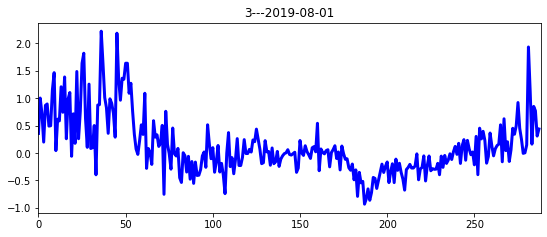

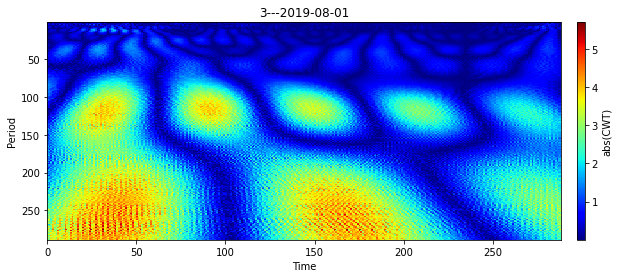

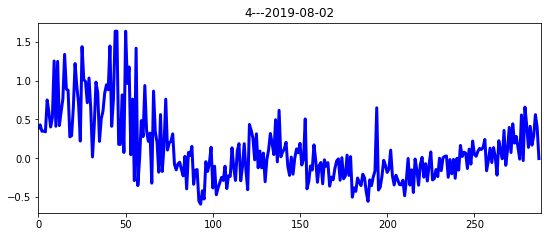

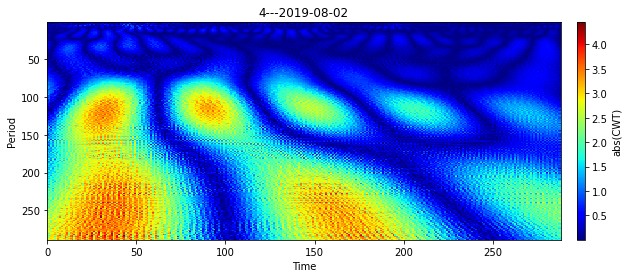

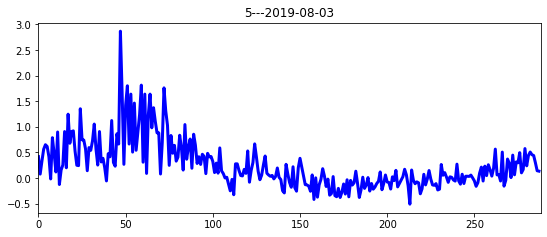

...

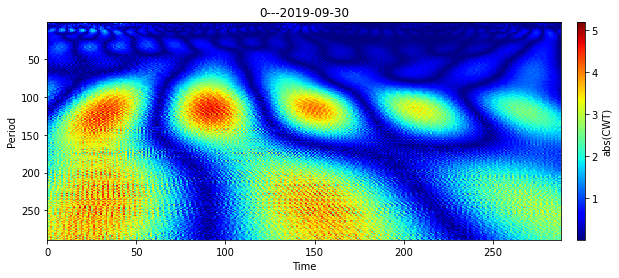

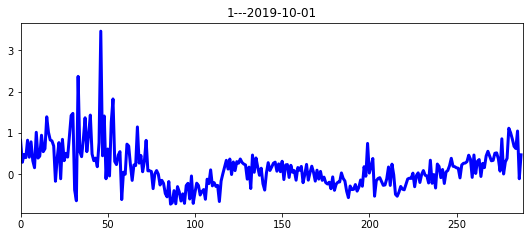

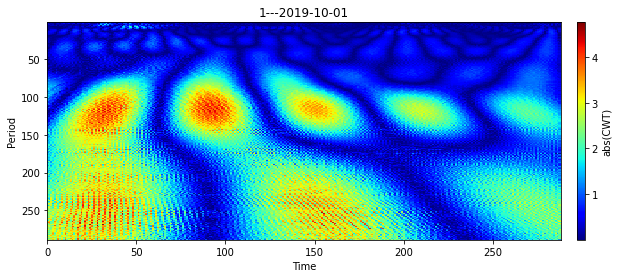

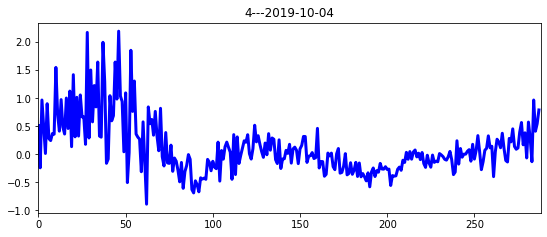

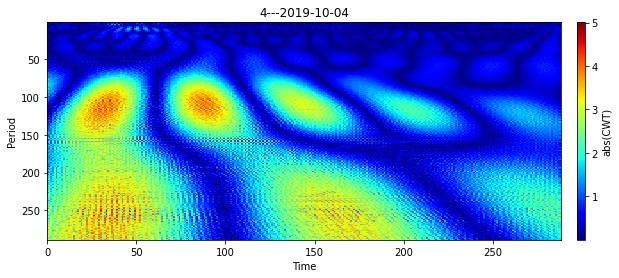

Error in callback <function flush_figures at 0x7f58b91f39d8> (for post_execute):


KeyboardInterrupt: 

In [119]:
"""
Difference multy day plots, Zscore ect.
"""

"""
One Channel
"""

def df2array_data(df, col_name):
    # generate a data set with np.arrays and labels
    X, y = [[] for x in range(len(fulldays))], [[] for x in range(len(fulldays))] # generate cells for data
    for idx, (day) in enumerate(fulldays):
        selected = df[df.day_id == day]
        my_array = selected[col_name].tolist()
        X[idx] = my_array
        y[idx] = selected.iloc[0,-1]

    train_labels_indicies = [[] for x in range(len(fulldays))]
    X = np.array(X)
    y = np.array(y)
    
    return X, y


def Zdata(data):
    data = (data - data.mean())/data.std()
    return data


def sigle_plot(my_array,name):
    nn = 33
    signal_length = 288
    # range of scales to perform the transform
    scales = scg.periods2scales( np.arange(1, signal_length+1) )
    x_values_wvt_arr = range(0,len(my_array),1)

    # plot the signal 
    fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
    ax1.plot(x_values_wvt_arr, my_array, linewidth=3, color='blue')
    ax1.set_xlim(0, signal_length)
    ax1.set_title(name)

    # the scaleogram
    scg.cws(my_array[:signal_length], scales=scales, figsize=(10, 4.0), coi = False, ylabel="Period", xlabel="Time",
            title=name);
    
#     plt.savefig(f'data/scaleogram_im/{name}.png', bbox_inches='tight')
#     print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(",
#           pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")




#signal indicies: 0 = body acc x, 1 = body acc y, 2 = body acc z, 3 = body gyro x, 4 = body gyro y, 5 = body gyro z, 6 = total acc x, 7 = total acc y, 8 = total acc z
signal = 3 # signal index
sample = 1 # sample index of each label indicies list
scales = np.arange(1, 65) # range of scales
wavelet = 'morl' # mother wavelet
scg.set_default_wavelet('morl')



X_vds, y = df2array_data(culled_df, 'vds_vol')
X_ccs, y = df2array_data(culled_df, 'ccs_vol')


rel = (X_vds-X_ccs)/X_ccs
rel_z = Zdata(rel)

# create image for each date
for array, date, label in zip(rel_z, fulldays, y):
    date = str(date).split('T')[0]
    sigle_plot(array, f'{label}---{date}')

In [66]:
culled_df.head()

,time_anchor_vds,std_time,vds_vol,ccs_vol,ccs_speed,vds_occ,Direction,one_hot_weekday,one_hot_weekend,one_hot_non_rush_hr,one_hot_rush_hr,day_id,week_value
77354,288.0,2019-08-01 00:00:00,63.0,89.0,70.7,3.72,E,1,0,1,0,2019-08-01,3
77355,289.0,2019-08-01 00:00:00,59.0,69.0,69.2,3.60,E,1,0,1,0,2019-08-01,3
77356,290.0,2019-08-01 00:00:00,53.0,67.0,69.3,3.39,E,1,0,1,0,2019-08-01,3
77357,291.0,2019-08-01 00:00:00,43.0,64.0,72.7,2.67,E,1,0,1,0,2019-08-01,3
77358,292.0,2019-08-01 00:00:00,47.0,57.0,69.8,2.73,E,1,0,1,0,2019-08-01,3


In [75]:
culled_df[culled_df['day_id']=='2019-12-20']

,time_anchor_vds,std_time,vds_vol,ccs_vol,ccs_speed,vds_occ,Direction,one_hot_weekday,one_hot_weekend,one_hot_non_rush_hr,one_hot_rush_hr,day_id,week_value
55083,40896.0,2019-12-20 00:00:00,71.0,82.0,70.3,4.08,E,1,0,1,0,2019-12-20,4
55084,40897.0,2019-12-20 00:00:00,70.0,92.0,70.6,4.08,E,1,0,1,0,2019-12-20,4
55085,40898.0,2019-12-20 00:00:00,56.0,65.0,69.1,3.12,E,1,0,1,0,2019-12-20,4
55086,40899.0,2019-12-20 00:00:00,66.0,84.0,71.2,4.08,E,1,0,1,0,2019-12-20,4
55087,40900.0,2019-12-20 00:00:00,63.0,79.0,71.0,4.08,E,1,0,1,0,2019-12-20,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
55366,41179.0,2019-12-20 00:00:00,106.0,148.0,70.9,6.48,E,1,0,1,0,2019-12-20,4
55367,41180.0,2019-12-20 00:00:00,94.0,119.0,70.3,5.46,E,1,0,1,0,2019-12-20,4
55368,41181.0,2019-12-20 00:00:00,105.0,160.0,70.9,6.60,E,1,0,1,0,2019-12-20,4
55369,41182.0,2019-12-20 00:00:00,88.0,113.0,70.7,5.40,E,1,0,1,0,2019-12-20,4


In [ ]:
#bad weather: 2020-07-04 

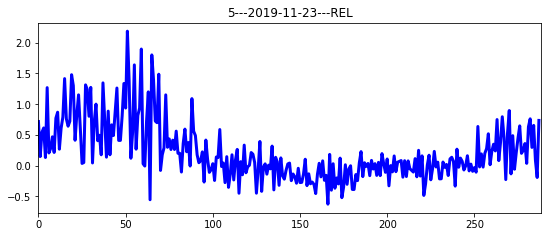

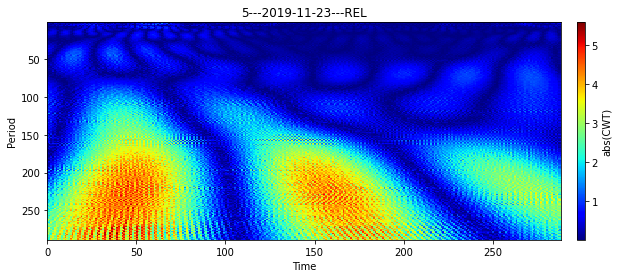

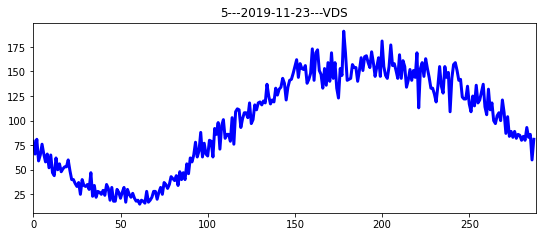

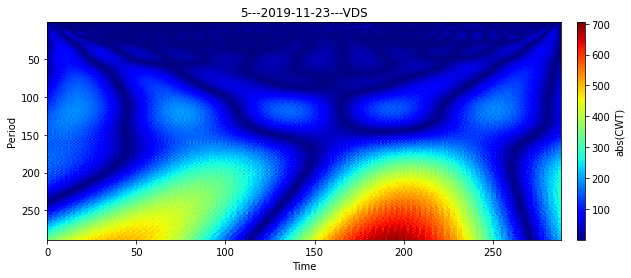

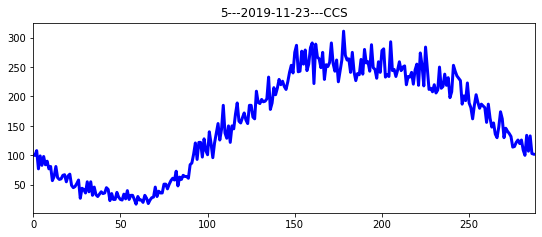

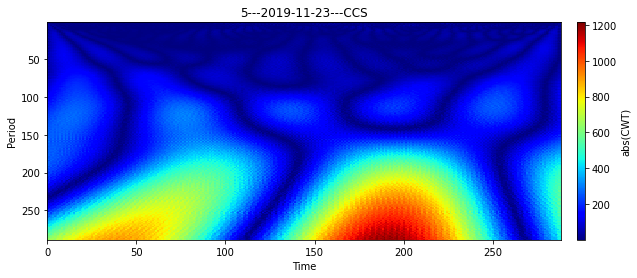

In [131]:
# create image for each date
for vds, ccs, array, date, label in zip(X_vds, X_ccs, rel_z, fulldays, y):
    main = date
    date = str(date).split('T')[0]
    
    if date == '2019-11-23': # drop off error [2019-10-23, 2020-07-08, 2020-07-04] ccs error? 2020-01-16
        sigle_plot(array, f'{label}---{date}---REL')
        sigle_plot(vds, f'{label}---{date}---VDS')
        sigle_plot(ccs, f'{label}---{date}---CCS')
        break

Default wavelet function used to compute the transform: morl ( Morlet wavelet )


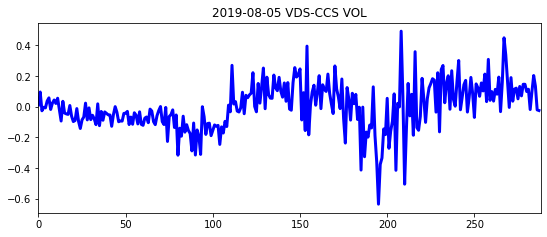

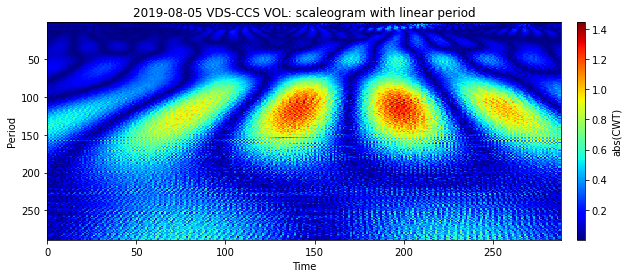

In [116]:
ZVDS = Zdata(VDS[0])
ZCCS = Zdata(CCS[0])

gg = ZVDS - ZCCS
my_array = gg
# choose default wavelet function 
scg.set_default_wavelet('morl')

data = '2019-08-05'


nn = 33
signal_length = 288
# range of scales to perform the transform
scales = scg.periods2scales( np.arange(1, signal_length+1) )
x_values_wvt_arr = range(0,len(my_array),1)

# plot the signal 
fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
ax1.plot(x_values_wvt_arr, my_array, linewidth=3, color='blue')
ax1.set_xlim(0, signal_length)
ax1.set_title(f"{data} VDS-CCS VOL")

# the scaleogram
scg.cws(my_array[:signal_length], scales=scales, figsize=(10, 4.0), coi = False, ylabel="Period", xlabel="Time",
        title=f'{data} VDS-CCS VOL: scaleogram with linear period'); 

print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(",
      pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")

In [ ]:
import pywt
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

def cwt_coeffs_per_label(X, label_indicies, signal, scales, wavelet):
    
    # amount of pixels in X and Y 
    rescale_size = 64
    # determine the max scale size
    n_scales = 64
    X_cwt = np.ndarray(shape=(len(X), rescale_size, rescale_size), dtype = 'float32')
    
    for sample in range(len(X)):
        coeffs, freqs = pywt.cwt(X[sample], scales, wavelet = wavelet)

        rescale_coeffs = resize(coeffs, (rescale_size, rescale_size), mode = 'constant')
        X_cwt[sample,:,:] = rescale_coeffs
    return X_cwt

# list of list of sample indicies per activity
# train_labels_indicies = split_indices_per_label(y_train)

#signal indicies: 0 = body acc x, 1 = body acc y, 2 = body acc z, 3 = body gyro x, 4 = body gyro y, 5 = body gyro z, 6 = total acc x, 7 = total acc y, 8 = total acc z
signal = 3 # signal index
sample = 1 # sample index of each label indicies list
scales = np.arange(1, 65) # range of scales
wavelet = 'morl' # mother wavelet

trainX = cwt_coeffs_per_label(X_train, train_labels_indicies, signal, scales, wavelet)

testX = cwt_coeffs_per_label(X_test, train_labels_indicies, signal, scales, wavelet)

In [ ]:
X_train_cwt_re = trainX.reshape(-1, 64, 64, 1)
X_test_cwt_re = testX.reshape(-1, 64, 64, 1)

yt = np.array(y_train)
ytest = np.array(y_test)

def build_cnn_model(activation, input_shape):
    model = Sequential()
    
    # 2 Convolution layer with Max polling
    model.add(Conv2D(32, 5, activation = activation, padding = 'same', input_shape = input_shape))
    model.add(MaxPooling2D())
    model.add(Conv2D(64, 5, activation = activation, padding = 'same', kernel_initializer = "he_normal"))
    model.add(MaxPooling2D())  
    model.add(Flatten())
    
    # 3 Full connected layer
    model.add(Dense(128, activation = activation, kernel_initializer = "he_normal"))
    model.add(Dense(54, activation = activation, kernel_initializer = "he_normal"))
    model.add(Dense(7, activation = 'softmax')) # 6 classes
    
    # summarize the model
    print(model.summary())
    return model

input_shape = X_train_cwt_re.shape[1:]
print(input_shape)

# create cnn model
cnn_model = build_cnn_model("relu", input_shape)

In [ ]:
cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy'])

# define callbacks
callbacks = [ModelCheckpoint(filepath='best_model.h5', monitor='val_sparse_categorical_accuracy', save_best_only=True)]

# fit the model
history = cnn_model.fit(x=X_train_cwt_re,
                    y=yt,
                    batch_size=300,
                    epochs=50,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=(X_test_cwt_re, ytest))